<a href="https://colab.research.google.com/github/mkcaliskan/DL_AgeGenderPrediction/blob/main/DeepProject2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install visualkeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 44.4 MB/s eta 0:00:00


In [ ]:
# Gerekli kütüphanelerin yüklenmesi

import os
import random
import numpy as np
import sklearn
import cv2
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam



import visualkeras
from visualkeras import layered_view
from PIL import Image
from PIL import ImageFont
from PIL import ImageDraw

In [ ]:
print(cv2.__version__)
print(sklearn.__version__)
import sys
print(sys.version)

4.8.0
1.2.2
3.10.12 (main, Mar 22 2024, 16:50:05) [GCC 11.4.0]


In [ ]:
seed_constant = 27
random.seed(seed_constant)

In [ ]:
# Google Drive'ı Colab'e bağlayalım
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Veri setimizin dizin yolunu gösterelim

# pic_dir = r'C:\Users\MeNoktaKemal\Desktop\proje1\dataset250' (yerel için)

pic_dir = '/content/drive/My Drive/proje/dataset2'
total_pic_names = os.listdir(pic_dir)
len(total_pic_names)

10999

In [ ]:
import tensorflow as tf

# TensorFlow'un GPU'yu tanıyıp tanımadığını kontrol edelim
device_name = tf.test.gpu_device_name()

if device_name != '/device:GPU:0':
    print('GPU bulunamadı')
else:
    print('GPU bulundu: {}'.format(device_name))

# GPU bilgilerini görüntüleme
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

GPU bulundu: /device:GPU:0


[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 9917260740158857724
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 21991653376
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 2696097466326419266
 physical_device_desc: "device: 0, name: NVIDIA L4, pci bus id: 0000:00:03.0, compute capability: 8.9"
 xla_global_id: 416903419]

In [ ]:
#total_pic_names  #değişkende saklı tüm resimlerin isimlerini alt alta sırala.
#bu şekilde --- 23_1_2_20170116173110409.jpg.chip.jpg
#print(total_pic_names)  #yan yana sırala

In [ ]:
#total_pic_nameste saklı görüntülerin içinden rastgele 6 tanesinin indeksini göster.
'''
random.sample içine tanımladığımız "range(n)" ifadesi 0'dan n-1'e kadar olan sayıları içeren bir dizini temsil eder.
burada n dediğimiz kısım "len(total_pic_names)" olarak belirlendi.
yani 0'dan total_pic_names'in eleman sayısına kadar (24109) bir sayı dizisi oluşturur.
yani bir manada artık, range(len(total_pic_names) sayı dizisi verisetimiz görsellerinin indislerini barındırıyor diyebiliriz.
random.sample işlevi, bu indis dizisinden rastgele 6 tanesini seçer ve random_select değişkenine atar.

'''
random_select = random.sample(range(len(total_pic_names)), 6)
print(random_select)

[10624, 7862, 4541, 4685, 3217, 1211]


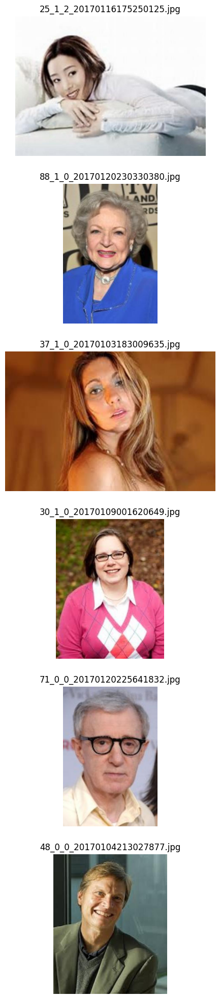

In [ ]:
# Veri setimiz içerisinden dosya isimleriyle birlikte 6 rastgele görüntüyü görselleştirelim.
'''
random_index değişkeni, random_select listesindeki elemanların kendilerini temsil eder.
yani random_select = [15739, 18800, 3316, 23088, 6594, 19280] ise,

ilk döngüde; sayaç 1, random_index '15739' olur.
total_pic_namesteki 15739. sıradaki dosya adı alınır ve pic_name değişkenine atanır.
ikinci döngüde; sayaç 2, random_index '18800' olur. 18800. sıradaki dosya adı alınır ve pic_name'e atanır.
pic_name değişkeni her döngüde rastgele seçilmiş random_select dizinindeki 6 görüntünün adını sırayla alır.

'''

# Görüntüleri görelleştirme
plt.figure(figsize = (25,25))
random_select = random.sample(range(len(total_pic_names)), 6)

for counter, random_index in enumerate(random_select, 1):
    pic_name = total_pic_names[random_index]

    # Görselleştirme için dosya yolu oluşturma, resmi okuma ve RGB formatına çevirme
    visualize_pic_path = os.path.join(pic_dir, pic_name)
    pic_bgr = cv2.imread(visualize_pic_path)
    pic_rgb = cv2.cvtColor(pic_bgr, cv2.COLOR_BGR2RGB)

    # Görüntüyü, adıyla birlikte gösterme
    plt.subplot(6, 1, counter)
    plt.imshow(pic_rgb)
    plt.title(pic_name)
    plt.axis('off')

plt.show()



In [ ]:
# Verisetindeki Dosya isimi hatalarını bulalım

def check_filename_format(filename):
    parts = filename.split('_')
    # Formatın doğru olduğundan emin olmak için gereken koşullar
    if len(parts) == 4 and parts[3].endswith('.jpg'):
        try:
            age = int(parts[0])
            gender = int(parts[1])
            # Diğer kısımlar da int olabilir, tarih bilgisi veya diğer bilgiler olabilir
            return True
        except ValueError:
            return False
    return False

# Dosya adlarını kontrol edelim
for pic_name in total_pic_names:
    if not check_filename_format(pic_name):
        print(f"Hatalı dosya adı formatı: {pic_name}")

In [ ]:
# Veri setini ön işlemeye başlayalım (Preprocessing)

# Verisetimizi içinden rastgele seçilen bir altküme ile sınırlayalım

# Daha önce oluşturduğumuz total_pic_names listesinden bir alt küme seçelim
subset_size = 8000
indices = np.random.choice(len(total_pic_names), subset_size, replace=False)
selected_pic_names = [total_pic_names[i] for i in indices]

pic_height = 224
pic_width = 224

# Görüntü dosyalarını yeniden boyutlandırıp, normalize edecek bir 'image_processing' işlevi tanımlayalım.
def image_processing(pic):
    resized_pic = cv2.resize(pic, (pic_height, pic_width))
    normalized_pic = resized_pic / 255.0
    return normalized_pic


# Etiketleri çıkarmak için işlevler oluşturalım

# Yaş etiketi çıkarmak için fonksiyon tanımlayalım
def age_label_extraction(pic_name):
    age = int(pic_name.split("_")[0])
    return age  #Yaş sınıfı indeksini doğrudan yaş olarak belirledik.

# Cinsiyet etiketi çıkarmak için fonksiyon tanımlayalım
def gender_label_extraction(pic_name):
    try:
        gender = int(pic_name.split("_")[1])
        if gender == 0 or gender == 1:
            return gender
        else:
            return None
    except (IndexError, ValueError) as e:
        print(f"Hata: {e}. Pic name: {pic_name}")
        return None


In [ ]:
# Görüntülerin özelliklerini ve etiketlerini oluşturalım

''' sınırlandırılmamış veriseti
def create_dataset():

    features = [] # Özellikler
    age_labels = []  # yaş etiketleri
    gender_labels = [] # cinsiyet etiketleri

    for pic_name in total_pic_names:
        pic_path = os.path.join(pic_dir, pic_name)
        preprocessed_pic = image_processing(pic_path) #preprocessed_pic = normalized_pic
        age_index = age_label_extraction(pic_name)
        gender_index = gender_label_extraction(pic_name)

        features.append(preprocessed_pic)
        age_labels.append(age_index)
        gender_labels.append(gender_index)


    features = np.array(features)
    age_labels = np.array(age_labels)
    gender_labels = np.array(gender_labels)

    return features, age_labels, gender_labels
'''



def create_subset_dataset(selected_pic_names):
    features = []  # Özellikler
    age_labels = []  # Yaş etiketleri
    gender_labels = []  # Cinsiyet etiketleri

    for pic_name in selected_pic_names:

        pic_path = os.path.join(pic_dir, pic_name)
        pic = cv2.imread(pic_path) # Sadece 7000 görüntü okunuyor.
        preprocessed_pic = image_processing(pic)  # preprocessed_pic = normalized_pic
        age_index = age_label_extraction(pic_name)
        gender_index = gender_label_extraction(pic_name)
        if gender_index is not None:  # None olan etiketleri atla
          features.append(preprocessed_pic)
          age_labels.append(age_index)
          gender_labels.append(gender_index)

    features = np.array(features)
    age_labels = np.array(age_labels)
    gender_labels = np.array(gender_labels)

    return features, age_labels, gender_labels


# bu aşamada gerekirse """ONE HOT ENCODING"""" uygulayabiliriz. şimdilik atlayalım.

In [ ]:
# Verileri eğitim ve test setine bölelim
##GÜNCELLENİYOR MU KONT##
''' SSSS
# Veri setimizi oluşturalım. /sınırlandırılmamış
features, age_labels, gender_labels = create_dataset()

# Özellikleri ve yaş etiketlerini ayıralım
features_train, features_test, age_labels_train, age_labels_test = train_test_split(
    features, age_labels, test_size=0.1,shuffle=True, random_state=seed_constant)

# Özellikleri ve cinsiyet etiketlerini ayıralım
features_train, features_test, gender_labels_train, gender_labels_test = train_test_split(
    features, gender_labels, test_size=0.1,shuffle=True, random_state=seed_constant)
'''
# 5.000 görüntüyle verisetimizi oluşturalım. /sınırlandırılmış
features, age_labels, gender_labels = create_subset_dataset(selected_pic_names)

# Özellikleri ve yaş etiketlerini ayıralım
#features_train, features_test, age_labels_train, age_labels_test = train_test_split(
#    features, age_labels, test_size=0.1, shuffle=True, random_state=seed_constant)

# Özellikleri ve cinsiyet etiketlerini ayıralım
#features_train, features_test, gender_labels_train, gender_labels_test = train_test_split(
#    features, gender_labels, test_size=0.1, shuffle=True, random_state=seed_constant)

features_train, features_test, age_labels_train, age_labels_test, gender_labels_train, gender_labels_test = train_test_split(
    features, age_labels, gender_labels, test_size=0.1, shuffle=True, random_state=seed_constant)



KeyboardInterrupt: 

In [ ]:
gender_labels_test.shape


(700,)

In [ ]:
# InceptionResNetV2 modelimizi yükleyelim ve yapılandıralım.

# InceptionResNetV2 modelini yükleyelim
input_shape = (224, 224, 3)
base_model2 = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

# Zaten eğitilmiş olan VGG katmanlarını donduralım
for layer in base_model2.layers:
    layer.trainable = False

# InceptionResNetV2 modelinin çıkışı düzleştirelim.
x = base_model2.output
x = Flatten()(x)

# Yoğun bağlı katmanlar ekleyerek, relu aktivasyonu ve L2 düzenlemesi uygulayalım
# Ayrıca, %50 dropout kullanarak ağın genelleştirme yeteneğini artıralım ve overfitting azaltalım.
x = Dense(1500, activation='relu', kernel_regularizer=l2(0.03))(x)
x = Dropout(0.5)(x)

x = Dense(1000, activation='relu', kernel_regularizer=l2(0.03))(x)
x = Dropout(0.5)(x)

x = Dense(512, activation='relu', kernel_regularizer=l2(0.03))(x)
x = Dropout(0.5)(x)

# Yaş tahmini için ek dense katman
x_age = Dense(256, activation='relu', kernel_regularizer=l2(0.03))(x)
x_age = Dropout(0.5)(x_age)

# Yaş tahmini için regresyon katmanı oluşturalım
age_prediction = Dense(1, activation='linear', name='age_prediction')(x_age)

# Cinsiyet tespiti için sınıflandırma katmanı oluşturalım
gender_prediction = Dense(1, activation='sigmoid', name='gender_prediction')(x)

# Modelimizi tanımlayalım
model = Model(inputs=base_model2.input, outputs=[age_prediction, gender_prediction])

# Modelimizin özetini yazdıralım
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_406 (Conv2D)         (None, 111, 111, 32)         864       ['input_3[0][0]']             
                                                                                                  
 batch_normalization_406 (B  (None, 111, 111, 32)         96        ['conv2d_406[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_406 (Activation  (None, 111, 111, 32)         0         ['batch_normalization_40

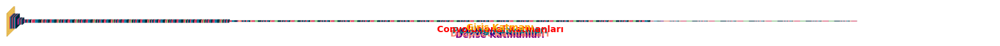

In [ ]:
# Modelimizi görselleştirelim

visualkeras.layered_view(model, to_file='model.png')
visualmodel = plt.imread('model.png')
plt.figure(figsize=(20, 20))
plt.imshow(visualmodel)
plt.axis('off')

plt.text(0.5, 0.05, 'Dense Katmanları', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, color='purple', fontweight='bold')
plt.text(0.5, 0.15, 'Flatten Katmanı', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, color='navy', fontweight='bold')
plt.text(0.5, 0.10, 'Dropout Katmanları', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, color='salmon', fontweight='bold')
plt.text(0.5, 0.20, 'Pooling Katmanları', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, color='teal', fontweight='bold')
plt.text(0.5, 0.25, 'Convolutional Katmanları', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, color='red', fontweight='bold')
plt.text(0.5, 0.30, 'Giriş Katmanı', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, color='orange', fontweight='bold')

plt.show()


In [ ]:
# Modeli eğitelim

'''# EarlyStopping oluşturalım
early_stopper = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True)

# CheckPoint oluşturalım
filepath = "BestWeights_trial.keras"
weight_saver = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, mode='max', save_best_only=True)'''

# Yeni early ve checkpoint deneme
# EarlyStopping oluşturalım
early_stopper = EarlyStopping(
    monitor='val_age_prediction_mae',
    patience=10,
    mode='min',
    restore_best_weights=True)

# CheckPoint oluşturalım
filepath = "BestWeights_trial.keras"
weight_saver = ModelCheckpoint(filepath,
                               monitor='val_gender_prediction_accuracy',
                               verbose=1,
                               mode='max',
                               save_best_only=True)

# ReduceLROnPlateau oluşturalım
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=5,
                              verbose=1,
                              min_lr=0.001)


# callbacks
callbacks_list = [early_stopper, weight_saver, reduce_lr]

# Modeli derleyelim
# Modelimiz birden fazla çıktı ürettiği için (age ve gender) loss ve metrics dictionary(sözlük) olarak belirtilmiştir.
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss={'age_prediction': 'mean_absolute_error',
          'gender_prediction': 'binary_crossentropy'},
    metrics={'age_prediction': 'mae',
             'gender_prediction': 'accuracy'})

# Modelimizi eğitelim
history = model.fit(
    features_train, {'age_prediction': age_labels_train, 'gender_prediction': gender_labels_train},
    epochs = 30,
    batch_size = 96,
    validation_split= 0.1,
    callbacks = callbacks_list)



Epoch 1/30
59/60 [============================>.] - ETA: 0s - loss: 155.7856 - age_prediction_loss: 14.5978 - gender_prediction_loss: 1.5209 - age_prediction_mae: 14.5978 - gender_prediction_accuracy: 0.6833
Epoch 1: val_gender_prediction_accuracy improved from -inf to 0.80317, saving model to BestWeights_trial.keras
60/60 [==============================] - 38s 444ms/step - loss: 155.7628 - age_prediction_loss: 14.5911 - gender_prediction_loss: 1.5198 - age_prediction_mae: 14.5911 - gender_prediction_accuracy: 0.6834 - val_loss: 139.0710 - val_age_prediction_loss: 13.4202 - val_gender_prediction_loss: 0.5870 - val_age_prediction_mae: 13.4202 - val_gender_prediction_accuracy: 0.8032
Epoch 2/30
59/60 [============================>.] - ETA: 0s - loss: 127.0190 - age_prediction_loss: 12.1519 - gender_prediction_loss: 0.9902 - age_prediction_mae: 12.1519 - gender_prediction_accuracy: 0.7474
Epoch 2: val_gender_prediction_accuracy improved from 0.80317 to 0.83175, saving model to BestWeights

In [ ]:
# En iyi doğrulama doğruluğuna sahip modelin ağırlıklarını yükleyelim
model.load_weights("BestWeights_trial.keras")

In [ ]:
# Modeli test verisi üzerinde değerlendirelim

model_evaluation_history = model.evaluate(features_test, {'age_prediction': age_labels_test, 'gender_prediction': gender_labels_test})

22/22 [==============================] - 2s 70ms/step - loss: 40.4800 - age_prediction_loss: 11.7179 - gender_prediction_loss: 0.3392 - age_prediction_mae: 11.7179 - gender_prediction_accuracy: 0.8500


In [ ]:
# Modelimizi kaydedelim
model.save("best_val_acc_model.keras")

In [ ]:
print(history.history.keys())


dict_keys(['loss', 'age_prediction_loss', 'gender_prediction_loss', 'age_prediction_mae', 'gender_prediction_accuracy', 'val_loss', 'val_age_prediction_loss', 'val_gender_prediction_loss', 'val_age_prediction_mae', 'val_gender_prediction_accuracy'])


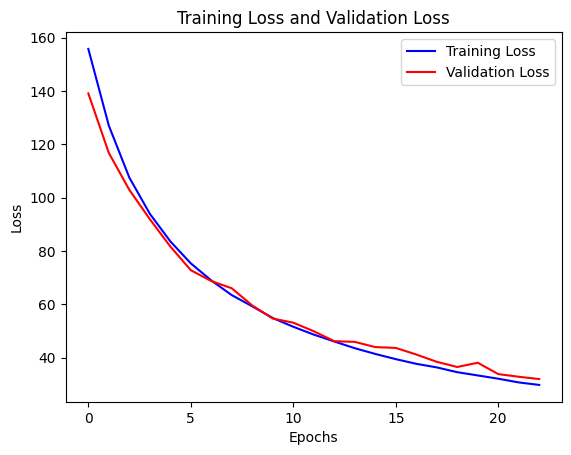

In [ ]:
# Eğitim ve Doğrulama Kaybı Grafiği Oluşturalım (modelin genel performansını inceleyelim)

epochs = range(len(history.history['loss']))

plt.plot(epochs, history.history['loss'], 'blue', label='Training Loss')
plt.plot(epochs, history.history['val_loss'], 'red', label='Validation Loss')

plt.title('Training Loss and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


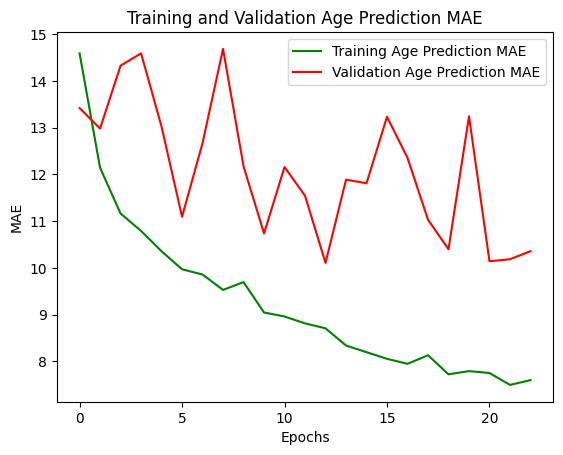

In [ ]:
# Yaş Tahmin MAE Grafiği Oluşturalım (Yaş tahmini doğruluğu grafiği) - düşük olmalı

epochs = range(len(history.history['age_prediction_mae']))

plt.plot(epochs, history.history['age_prediction_mae'], 'green', label='Training Age Prediction MAE')
plt.plot(epochs, history.history['val_age_prediction_mae'], 'red', label='Validation Age Prediction MAE')

plt.title('Training and Validation Age Prediction MAE')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()

plt.show()

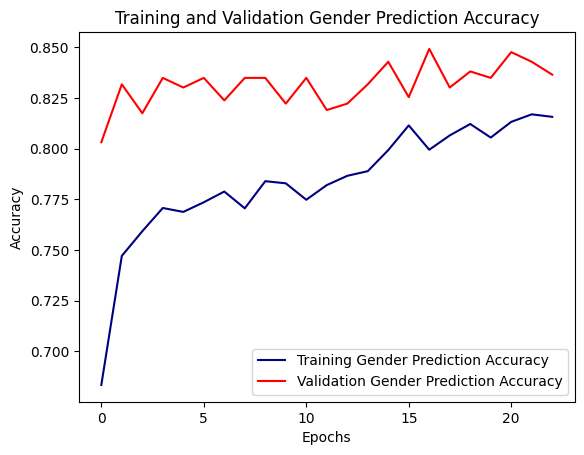

In [ ]:
# Cinsiyet Tahmini Doğruluğu Grafiği OLuşturalım

epochs = range(len(history.history["gender_prediction_accuracy"]))

plt.plot(epochs, history.history["gender_prediction_accuracy"], 'navy', label="Training Gender Prediction Accuracy")
plt.plot(epochs, history.history["val_gender_prediction_accuracy"], 'red', label="Validation Gender Prediction Accuracy")

plt.title("Training and Validation Gender Prediction Accuracy")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [ ]:
# Modelimizi yeni Görüntü verileriyle test edelim

'''
    def detect_age_gender(pic_path):
    try:
        pic = cv2.imread(pic_path)
        if pic is None:
            print(f"Görüntü okunamadı: {pic_path}")
            return None, None
        # Görüntüyü ön işleme tabi tutalım
        preprocessed_pic = image_processing(pic)
        reshaped_pic = np.reshape(preprocessed_pic, (1, 224, 224, 3))
        print("Picture shape:", picture.shape)
        print("Picture dtype:", picture.dtype)



        # Modelden tahminler alalım
        predictions = model.predict(normalized_picture)

        age_prediction = predictions[0][0]
        gender_prediction = predictions[1][0]


        model.predict fonksiyonu 2 tahmin döndürecektir; yaş ve cinsiyet.

        age_prediction için açıklama:
        1. predictions[0]: Modelin birinci çıkışını temsil eder. Bu çıkış, yaş tahminini yapar.
        2. predictions[0][0]: predictions[0]'ın ilk elemanıdır ve bu, yaş tahmininin doğrudan değeridir.
           Model, yaş tahminini 'lineer aktivasyon fonksiyonu' kullanarak doğrudan bir sayısal değer olarak döndürür.
           Bu değer doğrudan 'age_prediction' değişkeninde saklanır.

        gender_prediction için açıklama:
        1. predictions[1]: Modelin ikinci çıkışını temsil eder. Bu çıkış, cinsiyet tahminini yapar.
        2. predictions[1][0]: predictions[1]'in ilk elemanıdır ve bu, cinsiyet tahmininin olasılık değeridir.
           Model, cinsiyet tahminini 'sigmoid aktivasyon fonksiyonu' kullanarak [0, 1] aralığında bir olasılık değeri olarak döndürür.
           Bu değer, '0.5' eşik değerinden büyükse "Erkek", küçükse "Kadın" olarak sınıflandırılır ve 'gender' değişkenine atanır.


        # Cinsiyet tahminini belirleyelim
        if gender_prediction > 0.5:
            gender = "Erkek"
        else:
            gender = "Kadin"

        return age_prediction, gender

    except Exception as e:
        print(f"Hata: {e}")
        return None, None
'''


def detect_age_gender(pic_path):
    try:
        pic = cv2.imread(pic_path)
        if pic is None:
            print(f"Görüntü okunamadı: {pic_path}")
            return None, None

        preprocessed_pic = image_processing(pic)
        reshaped_pic = np.reshape(preprocessed_pic, (1, 224, 224, 3))

        # Modelden tahminler alalım
        predictions = model.predict(reshaped_pic)
        #YENİ EKLENENLER
        print(f"Tahminler: {predictions}")
        # Yaş tahmini: 4D diziden tekil değer alalım
        age_prediction_array = predictions[0]
        age_prediction = age_prediction_array.mean()  # Veya başka uygun bir yöntem kullanarak tekil değer elde edebiliriz

        # Cinsiyet tahmini: 2D diziden tekil değer alalım
        gender_prediction_array = predictions[1]
        gender_prediction = gender_prediction_array[0, 0]
        print(f"Yaş Tahmini: {age_prediction}, Cinsiyet Tahmini: {gender_prediction}")
        """
        #age_prediction = predictions[0][0]
        #gender_prediction = predictions[1][0]
        """
        if gender_prediction < 0.5:
            gender = "Erkek"
        else:
            gender = "Kadin"

        return age_prediction, gender

    except Exception as e:
        print(f"Hata: {e}")
        return None, None


İşleniyor: /content/drive/My Drive/proje/datateni/IMG-20180726-WA0042.jpg
1/1 [==============================] - 3s 3s/step
Tahminler: [array([[17.72962]], dtype=float32), array([[0.58288014]], dtype=float32)]
Yaş Tahmini: 17.7296199798584, Cinsiyet Tahmini: 0.5828801393508911


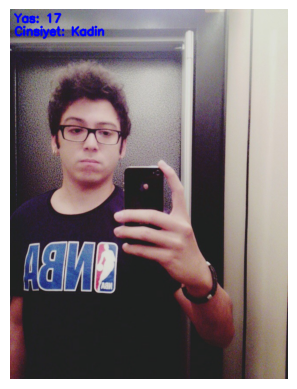

İşleniyor: /content/drive/My Drive/proje/datateni/faa4138a-ea8a-475d-90cc-efe397f90a48.jpg
1/1 [==============================] - 0s 41ms/step
Tahminler: [array([[28.60317]], dtype=float32), array([[0.0625026]], dtype=float32)]
Yaş Tahmini: 28.60317039489746, Cinsiyet Tahmini: 0.06250260025262833


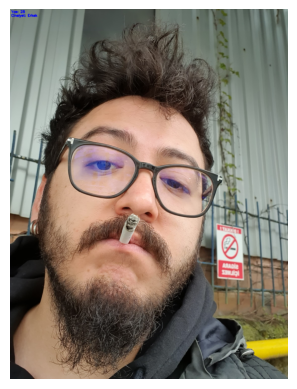

İşleniyor: /content/drive/My Drive/proje/datateni/1678800368575.jpg
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[30.415731]], dtype=float32), array([[0.00491654]], dtype=float32)]
Yaş Tahmini: 30.41573143005371, Cinsiyet Tahmini: 0.0049165417440235615


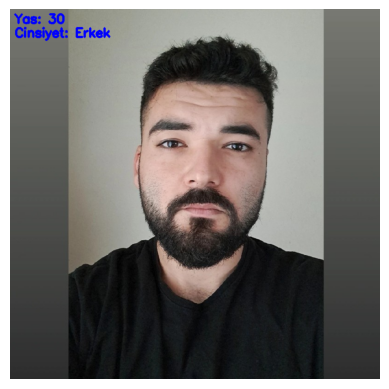

İşleniyor: /content/drive/My Drive/proje/datateni/Fs-MLlZXoCENFr4.jpg
1/1 [==============================] - 0s 37ms/step
Tahminler: [array([[25.076847]], dtype=float32), array([[0.99479103]], dtype=float32)]
Yaş Tahmini: 25.076847076416016, Cinsiyet Tahmini: 0.9947910308837891


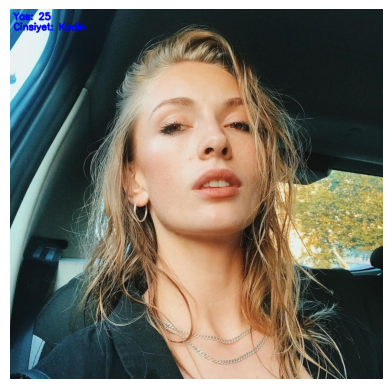

İşleniyor: /content/drive/My Drive/proje/datateni/420990234_1146785569671269_4751198219910383134_n.jpg
1/1 [==============================] - 0s 37ms/step
Tahminler: [array([[34.044544]], dtype=float32), array([[0.22174096]], dtype=float32)]
Yaş Tahmini: 34.0445442199707, Cinsiyet Tahmini: 0.2217409610748291


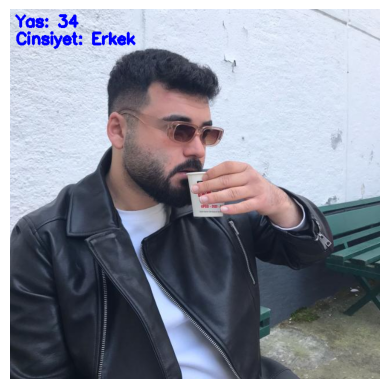

İşleniyor: /content/drive/My Drive/proje/datateni/4308057_o4b5a.jpg
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[48.105328]], dtype=float32), array([[0.00051324]], dtype=float32)]
Yaş Tahmini: 48.10532760620117, Cinsiyet Tahmini: 0.0005132405203767121


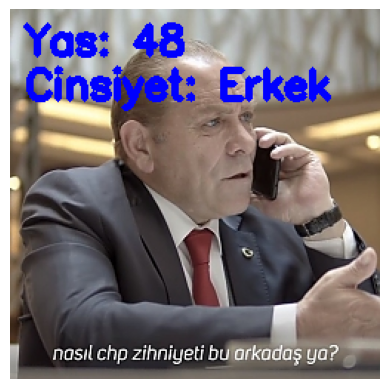

İşleniyor: /content/drive/My Drive/proje/datateni/file.jpg
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[28.97002]], dtype=float32), array([[0.9398742]], dtype=float32)]
Yaş Tahmini: 28.970020294189453, Cinsiyet Tahmini: 0.9398741722106934


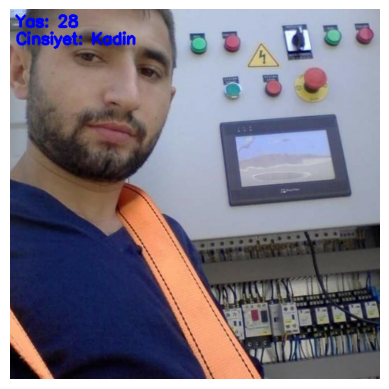

İşleniyor: /content/drive/My Drive/proje/datateni/filsssse.jpg
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[16.231901]], dtype=float32), array([[0.01134161]], dtype=float32)]
Yaş Tahmini: 16.231901168823242, Cinsiyet Tahmini: 0.011341609060764313


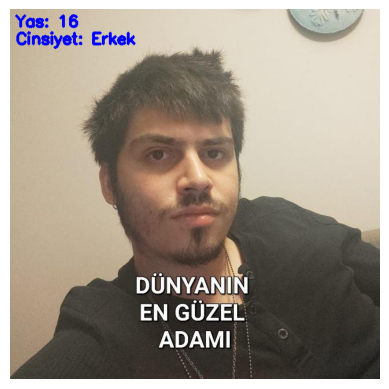

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran görüntüsü 2024-sdsdsds-14 021541.png
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[36.734745]], dtype=float32), array([[0.00173302]], dtype=float32)]
Yaş Tahmini: 36.734745025634766, Cinsiyet Tahmini: 0.0017330244882032275


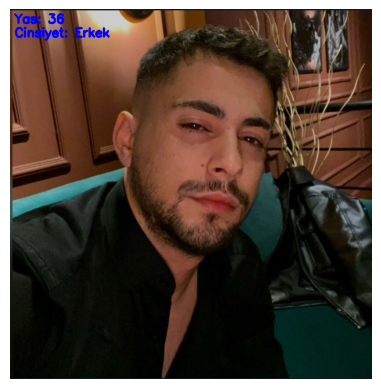

İşleniyor: /content/drive/My Drive/proje/datateni/asdasdasz33.png
1/1 [==============================] - 0s 37ms/step
Tahminler: [array([[27.499964]], dtype=float32), array([[0.05351554]], dtype=float32)]
Yaş Tahmini: 27.499963760375977, Cinsiyet Tahmini: 0.053515538573265076


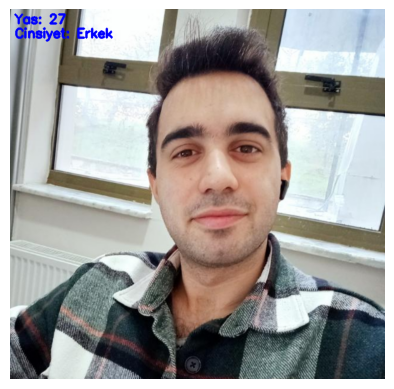

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran görüntüsü 2024-07-sdadsadsd021719.png
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[31.728765]], dtype=float32), array([[0.01045502]], dtype=float32)]
Yaş Tahmini: 31.7287654876709, Cinsiyet Tahmini: 0.010455022566020489


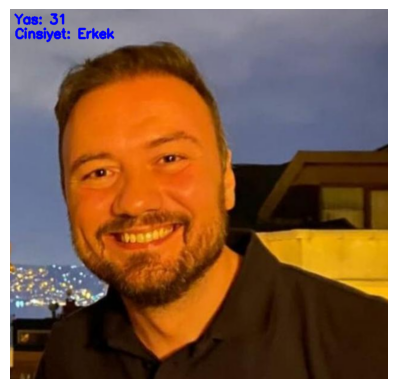

İşleniyor: /content/drive/My Drive/proje/datateni/sadasffsa836.png
1/1 [==============================] - 0s 39ms/step
Tahminler: [array([[9.561415]], dtype=float32), array([[0.9236841]], dtype=float32)]
Yaş Tahmini: 9.56141471862793, Cinsiyet Tahmini: 0.9236841201782227


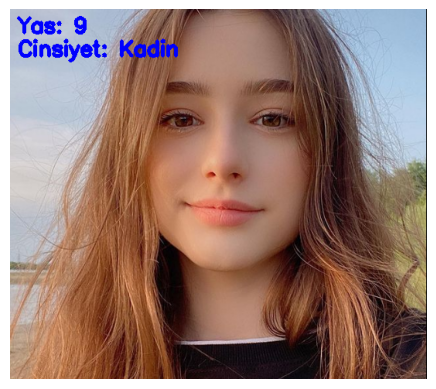

İşleniyor: /content/drive/My Drive/proje/datateni/resisdsdsm.jpg
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[36.880634]], dtype=float32), array([[0.00023391]], dtype=float32)]
Yaş Tahmini: 36.88063430786133, Cinsiyet Tahmini: 0.00023391425202134997


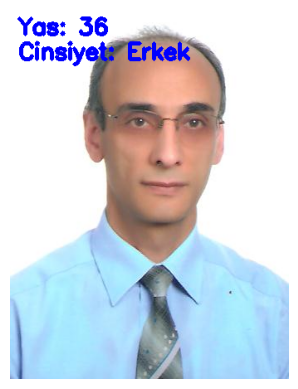

İşleniyor: /content/drive/My Drive/proje/datateni/dasdsadsad.jpg
1/1 [==============================] - 0s 39ms/step
Tahminler: [array([[25.56515]], dtype=float32), array([[0.00386434]], dtype=float32)]
Yaş Tahmini: 25.565149307250977, Cinsiyet Tahmini: 0.003864338155835867


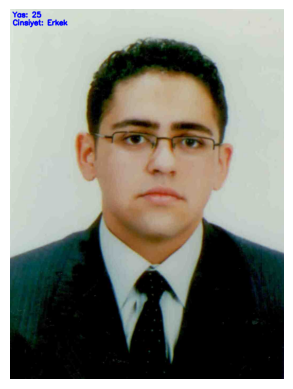

İşleniyor: /content/drive/My Drive/proje/datateni/fisdsdsle.jpg
1/1 [==============================] - 0s 37ms/step
Tahminler: [array([[31.48104]], dtype=float32), array([[0.11826996]], dtype=float32)]
Yaş Tahmini: 31.48103904724121, Cinsiyet Tahmini: 0.11826995760202408


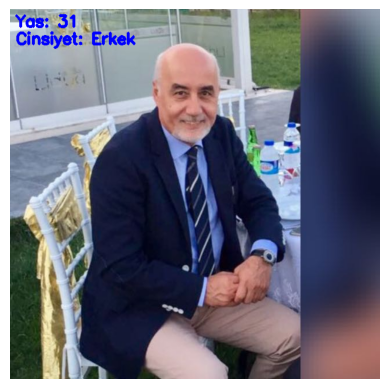

İşleniyor: /content/drive/My Drive/proje/datateni/dxfhushuyadsh.jpg
1/1 [==============================] - 0s 39ms/step
Tahminler: [array([[36.95279]], dtype=float32), array([[0.00103338]], dtype=float32)]
Yaş Tahmini: 36.952789306640625, Cinsiyet Tahmini: 0.0010333782993257046


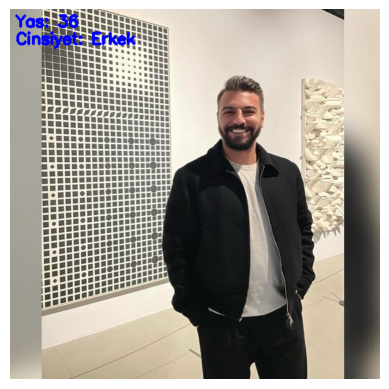

İşleniyor: /content/drive/My Drive/proje/datateni/140772-kurtlar-vadisinin-efsane-oyunculari--9_0.jpg
1/1 [==============================] - 0s 39ms/step
Tahminler: [array([[37.441956]], dtype=float32), array([[0.00016587]], dtype=float32)]
Yaş Tahmini: 37.44195556640625, Cinsiyet Tahmini: 0.0001658659748500213


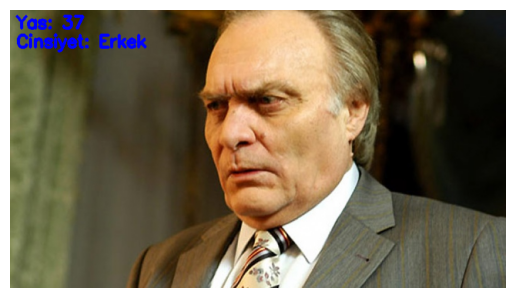

İşleniyor: /content/drive/My Drive/proje/datateni/indsdsdir.jpg
1/1 [==============================] - 0s 39ms/step
Tahminler: [array([[33.48117]], dtype=float32), array([[0.00874634]], dtype=float32)]
Yaş Tahmini: 33.481170654296875, Cinsiyet Tahmini: 0.00874633900821209


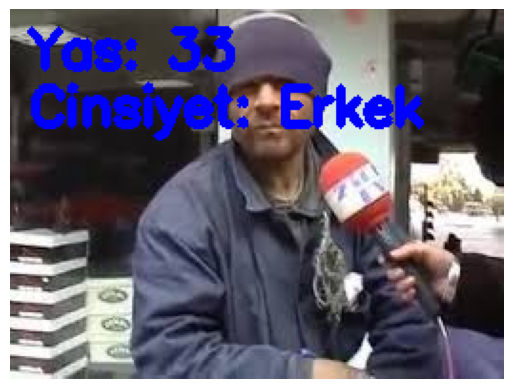

İşleniyor: /content/drive/My Drive/proje/datateni/AGSP-Elsie-1.jpg
1/1 [==============================] - 0s 40ms/step
Tahminler: [array([[21.311617]], dtype=float32), array([[0.8604592]], dtype=float32)]
Yaş Tahmini: 21.311616897583008, Cinsiyet Tahmini: 0.8604592084884644


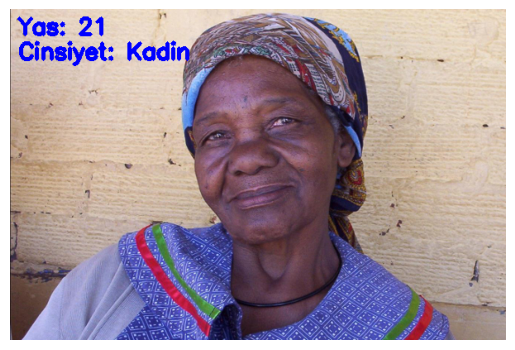

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran sdsdwdw2024-07-14 022532.png
1/1 [==============================] - 0s 39ms/step
Tahminler: [array([[20.976034]], dtype=float32), array([[0.06617953]], dtype=float32)]
Yaş Tahmini: 20.97603416442871, Cinsiyet Tahmini: 0.06617952883243561


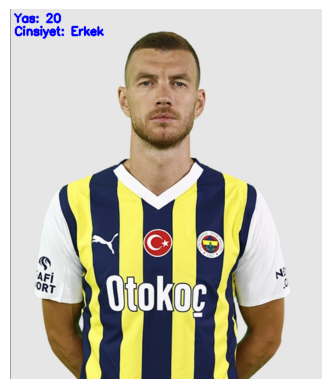

İşleniyor: /content/drive/My Drive/proje/datateni/11sdsds50245.jpg
1/1 [==============================] - 0s 40ms/step
Tahminler: [array([[62.701305]], dtype=float32), array([[0.02301983]], dtype=float32)]
Yaş Tahmini: 62.7013053894043, Cinsiyet Tahmini: 0.023019826039671898


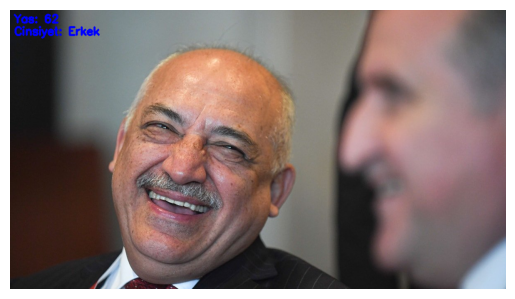

İşleniyor: /content/drive/My Drive/proje/datateni/2821sds-J5KO5.jpg
1/1 [==============================] - 0s 41ms/step
Tahminler: [array([[16.609505]], dtype=float32), array([[0.9821332]], dtype=float32)]
Yaş Tahmini: 16.60950469970703, Cinsiyet Tahmini: 0.9821332097053528


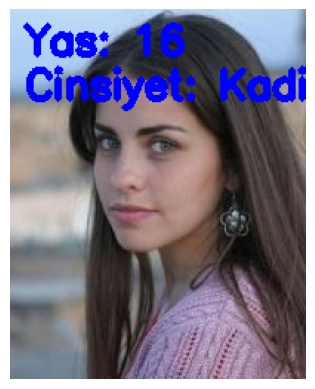

İşleniyor: /content/drive/My Drive/proje/datateni/thumbs_b_c_182d9ee8af10faaa757031e2f1095f54.jpg
1/1 [==============================] - 0s 40ms/step
Tahminler: [array([[41.30518]], dtype=float32), array([[0.00644167]], dtype=float32)]
Yaş Tahmini: 41.305179595947266, Cinsiyet Tahmini: 0.006441671866923571


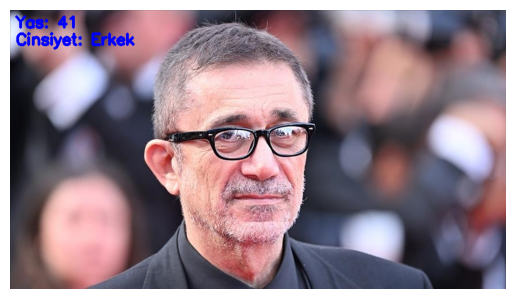

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran görüntüsü sdsdsds-07-14 023147.png
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[15.605176]], dtype=float32), array([[0.9420827]], dtype=float32)]
Yaş Tahmini: 15.605175971984863, Cinsiyet Tahmini: 0.9420827031135559


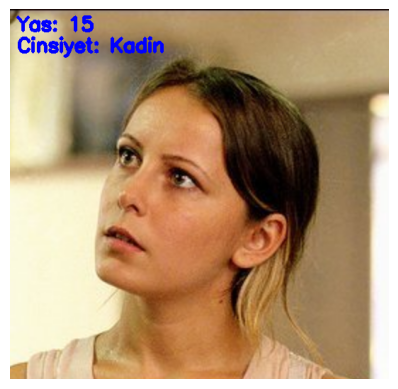

İşleniyor: /content/drive/My Drive/proje/datateni/zeki-demirkubuz_6286_b.jpg
1/1 [==============================] - 0s 42ms/step
Tahminler: [array([[35.185047]], dtype=float32), array([[0.00060585]], dtype=float32)]
Yaş Tahmini: 35.1850471496582, Cinsiyet Tahmini: 0.0006058470462448895


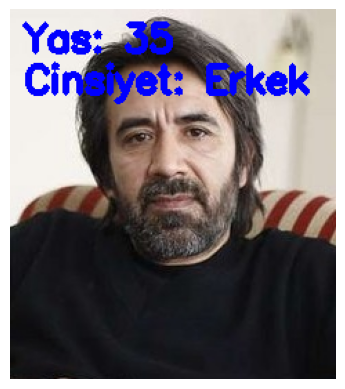

İşleniyor: /content/drive/My Drive/proje/datateni/4Ue4wcx7ryqdKoIuNLOcKRBMdEs.jpg
1/1 [==============================] - 0s 43ms/step
Tahminler: [array([[27.605686]], dtype=float32), array([[0.05031778]], dtype=float32)]
Yaş Tahmini: 27.60568618774414, Cinsiyet Tahmini: 0.050317779183387756


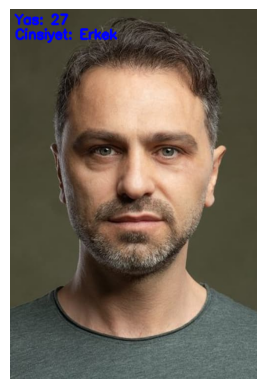

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran görüntüsü 2024sdsdsds-07-14 044802.png
1/1 [==============================] - 0s 40ms/step
Tahminler: [array([[27.126314]], dtype=float32), array([[0.00440891]], dtype=float32)]
Yaş Tahmini: 27.126314163208008, Cinsiyet Tahmini: 0.004408905748277903


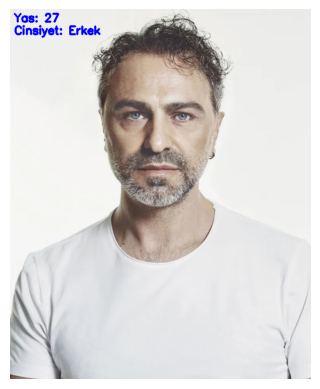

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran gödsadasdsadasd045148.png
1/1 [==============================] - 0s 41ms/step
Tahminler: [array([[24.770819]], dtype=float32), array([[0.01477471]], dtype=float32)]
Yaş Tahmini: 24.77081871032715, Cinsiyet Tahmini: 0.014774707145988941


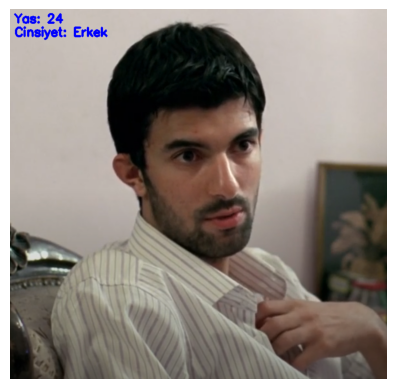

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran görüdsadsadsadad07-14 045209.png
1/1 [==============================] - 0s 41ms/step
Tahminler: [array([[23.503439]], dtype=float32), array([[0.06368119]], dtype=float32)]
Yaş Tahmini: 23.50343894958496, Cinsiyet Tahmini: 0.06368118524551392


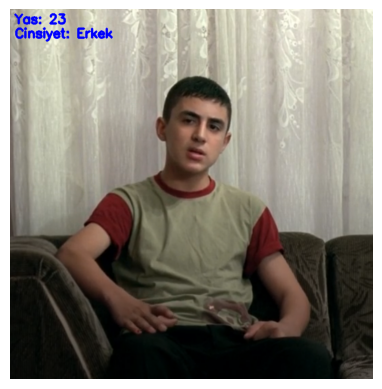

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran gösadasdsadasd045250.png
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[16.291264]], dtype=float32), array([[0.9732415]], dtype=float32)]
Yaş Tahmini: 16.291263580322266, Cinsiyet Tahmini: 0.9732415080070496


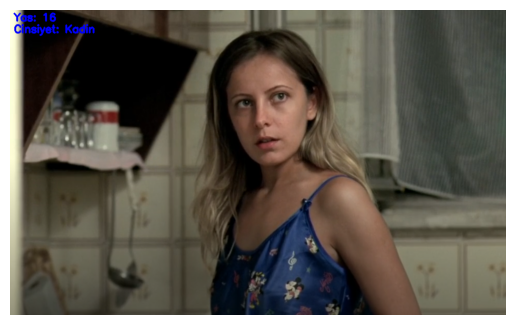

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran asdsadsadasd24-07-14 045322.png
1/1 [==============================] - 0s 40ms/step
Tahminler: [array([[23.253754]], dtype=float32), array([[0.976488]], dtype=float32)]
Yaş Tahmini: 23.253753662109375, Cinsiyet Tahmini: 0.9764879941940308


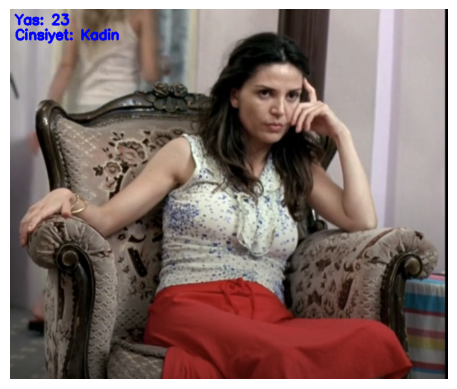

İşleniyor: /content/drive/My Drive/proje/datateni/Ekranxzczczxczxc024-07-14 045404.png
1/1 [==============================] - 0s 39ms/step
Tahminler: [array([[32.46482]], dtype=float32), array([[0.08311874]], dtype=float32)]
Yaş Tahmini: 32.464820861816406, Cinsiyet Tahmini: 0.0831187441945076


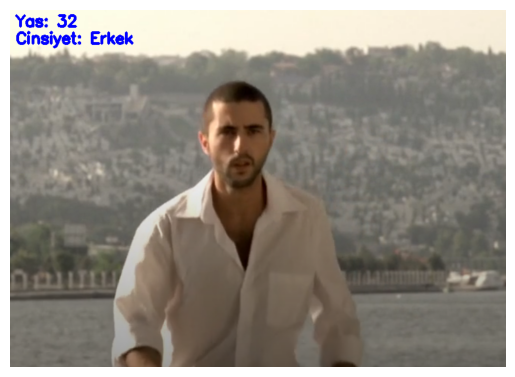

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran görünzxczxczxczxc45458.png
1/1 [==============================] - 0s 39ms/step
Tahminler: [array([[25.54717]], dtype=float32), array([[0.01383998]], dtype=float32)]
Yaş Tahmini: 25.547170639038086, Cinsiyet Tahmini: 0.013839984312653542


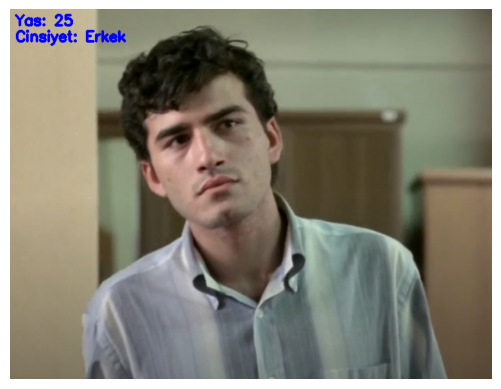

İşleniyor: /content/drive/My Drive/proje/datateni/sdasdasd4-07-14 045539.png
1/1 [==============================] - 0s 37ms/step
Tahminler: [array([[23.636946]], dtype=float32), array([[0.04224266]], dtype=float32)]
Yaş Tahmini: 23.636945724487305, Cinsiyet Tahmini: 0.04224265739321709


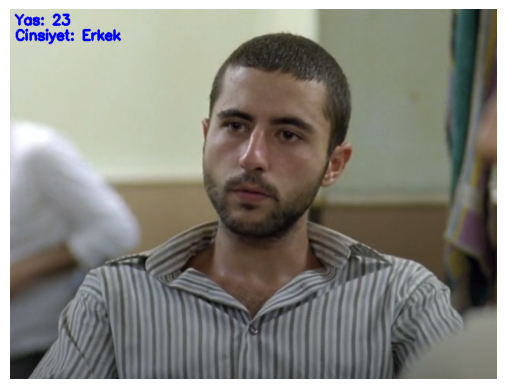

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran gasdasdsad045615.png
1/1 [==============================] - 0s 40ms/step
Tahminler: [array([[25.348095]], dtype=float32), array([[0.46745285]], dtype=float32)]
Yaş Tahmini: 25.348094940185547, Cinsiyet Tahmini: 0.46745285391807556


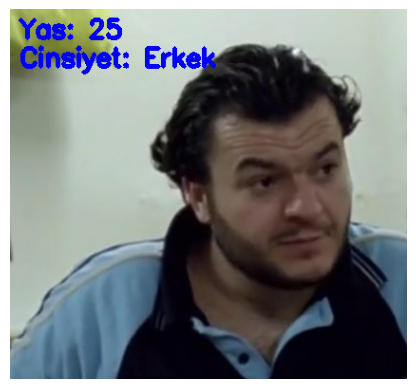

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran görüntüsü sadasdsad45722.png
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[18.749052]], dtype=float32), array([[0.2530139]], dtype=float32)]
Yaş Tahmini: 18.749052047729492, Cinsiyet Tahmini: 0.2530139088630676


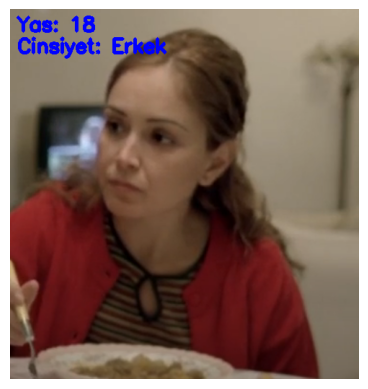

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran gsadasdasd024-07-14 045830.png
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[53.173683]], dtype=float32), array([[0.00203464]], dtype=float32)]
Yaş Tahmini: 53.173683166503906, Cinsiyet Tahmini: 0.0020346427336335182


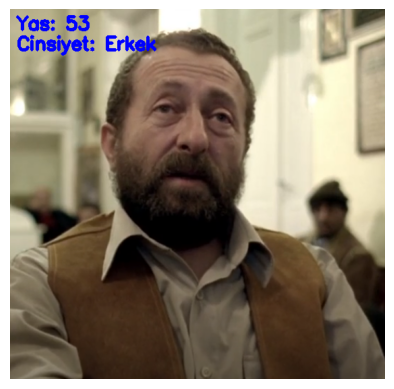

İşleniyor: /content/drive/My Drive/proje/datateni/asdasdsada50000.png
1/1 [==============================] - 0s 46ms/step
Tahminler: [array([[36.776188]], dtype=float32), array([[0.00020828]], dtype=float32)]
Yaş Tahmini: 36.776187896728516, Cinsiyet Tahmini: 0.00020828367269132286


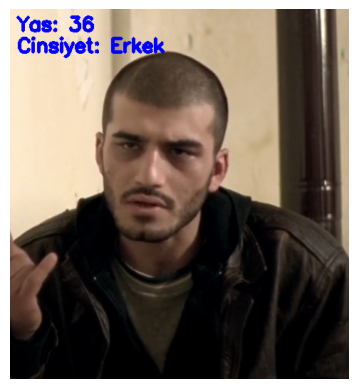

İşleniyor: /content/drive/My Drive/proje/datateni/Ekran gasdasdasdsa07-14 050047.png
1/1 [==============================] - 0s 43ms/step
Tahminler: [array([[11.690784]], dtype=float32), array([[0.92800385]], dtype=float32)]
Yaş Tahmini: 11.690784454345703, Cinsiyet Tahmini: 0.9280038475990295


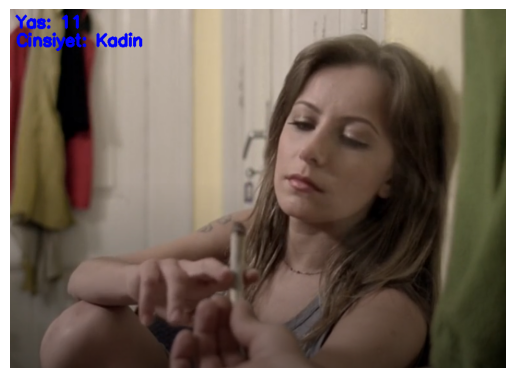

İşleniyor: /content/drive/My Drive/proje/datateni/Kid-s-Clothing-Set-Baba-Suit-B-1688391083.jpeg
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[31.490368]], dtype=float32), array([[0.23648572]], dtype=float32)]
Yaş Tahmini: 31.490367889404297, Cinsiyet Tahmini: 0.23648571968078613


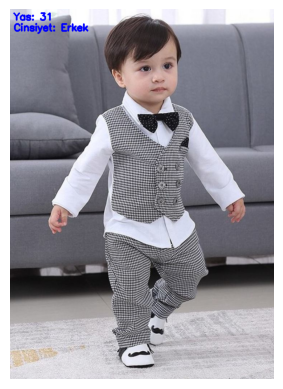

İşleniyor: /content/drive/My Drive/proje/datateni/Screenshot_20240717_132702_Instagram.jpg
1/1 [==============================] - 0s 38ms/step
Tahminler: [array([[17.876604]], dtype=float32), array([[0.2196254]], dtype=float32)]
Yaş Tahmini: 17.876604080200195, Cinsiyet Tahmini: 0.21962539851665497


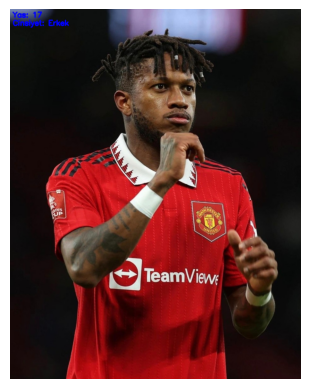

İşleniyor: /content/drive/My Drive/proje/datateni/images (20).jpeg
1/1 [==============================] - 0s 42ms/step
Tahminler: [array([[23.167017]], dtype=float32), array([[0.9893443]], dtype=float32)]
Yaş Tahmini: 23.167016983032227, Cinsiyet Tahmini: 0.9893442988395691


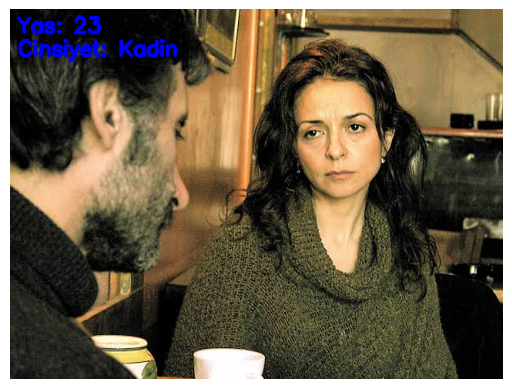

İşleniyor: /content/drive/My Drive/proje/datateni/images (19).jpeg
1/1 [==============================] - 0s 45ms/step
Tahminler: [array([[55.670616]], dtype=float32), array([[0.00141312]], dtype=float32)]
Yaş Tahmini: 55.670616149902344, Cinsiyet Tahmini: 0.0014131219359114766


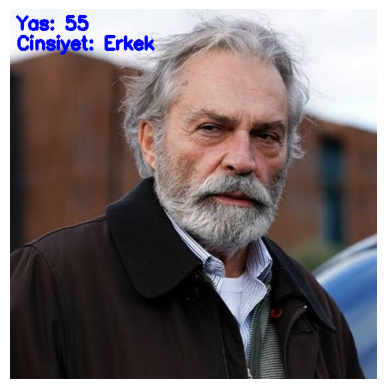

İşleniyor: /content/drive/My Drive/proje/datateni/images (18).jpeg
1/1 [==============================] - 0s 40ms/step
Tahminler: [array([[22.918938]], dtype=float32), array([[0.99074906]], dtype=float32)]
Yaş Tahmini: 22.91893768310547, Cinsiyet Tahmini: 0.9907490611076355


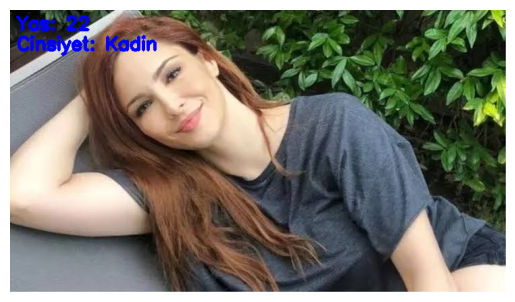

In [ ]:
# Yeni veri seti yolumuzu belirleyelim
newset_dir ='/content/drive/My Drive/proje/datateni'
#newset_dir = r'C:\Users\MeNoktaKemal\Desktop\proje1\newdataset' (yerel)
newset_pic_names = os.listdir(newset_dir)

for counter, newset_pic_name in enumerate(newset_pic_names):
    # Seçilen görüntünün dosya yolu
    newpic_path = os.path.join(newset_dir, newset_pic_name)
    print(f"İşleniyor: {newpic_path}")

    # Tahminleme yapalım
    predicted_age, predicted_gender = detect_age_gender(newpic_path)

    if predicted_age is None or predicted_gender is None:
        print(f"Tahmin yapılamadı: {newpic_path}")
        continue  # Tahmin yapılamadıysa bu resmi atla


    # Görüntüyü okuyalım
    newpic_bgr = cv2.imread(newpic_path)
    if newpic_bgr is None:
        print(f"Görüntü okunamadı: {newpic_path}")
    else:
        # Görüntü başarıyla okundu, şimdi resize işlemi yapabilirsiniz
        newpic_rgb = cv2.cvtColor(newpic_bgr, cv2.COLOR_BGR2RGB)


        # Tahmin edilen yaş ve cinsiyeti görüntünün üstüne yazalım
        cv2.putText(newpic_rgb, f"Yas: {int(predicted_age)}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 3)
        cv2.putText(newpic_rgb, f"Cinsiyet: {predicted_gender}", (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 3)

        # Seçilen görüntüyü gösterelim
        plt.imshow(newpic_rgb)
        plt.axis('off')
        plt.show()